# DS 6040: Bayesian Machine Learning
### Final Project: Predicting Miami Housing Prices

Ethan Assefa, Thomas Burrell, Tatev Gomstyan

## Business Understanding: The Housing Problem

In [106]:
# Bring in necessary packages
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import pymc as pm
import seaborn as sns
import arviz as az
import geopandas as gpd
import pandas as pd
from shapely.geometry import Point
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from imblearn.under_sampling import EditedNearestNeighbours
from sklearn.metrics import mean_squared_error
from matplotlib.patches import Patch

# Load in the data
miami_main = pd.read_csv("miami-housing.csv")

## Data Understanding: Exploratory Data Analysis (EDA)

In [107]:
# Show first few rows
miami_main.head()

,LATITUDE,LONGITUDE,PARCELNO,SALE_PRC,LND_SQFOOT,TOT_LVG_AREA,SPEC_FEAT_VAL,RAIL_DIST,OCEAN_DIST,WATER_DIST,CNTR_DIST,SUBCNTR_DI,HWY_DIST,age,avno60plus,month_sold,structure_quality
0,25.891031,-80.160561,622280070620,440000.0,9375,1753,0,2815.9,12811.4,347.6,42815.3,37742.2,15954.9,67,0,8,4
1,25.891324,-80.153968,622280100460,349000.0,9375,1715,0,4359.1,10648.4,337.8,43504.9,37340.5,18125.0,63,0,9,4
2,25.891334,-80.153740,622280100470,800000.0,9375,2276,49206,4412.9,10574.1,297.1,43530.4,37328.7,18200.5,61,0,2,4
3,25.891765,-80.152657,622280100530,988000.0,12450,2058,10033,4585.0,10156.5,0.0,43797.5,37423.2,18514.4,63,0,9,4
4,25.891825,-80.154639,622280100200,755000.0,12800,1684,16681,4063.4,10836.8,326.6,43599.7,37550.8,17903.4,42,0,7,4


### Cleaning

In [108]:
# take out lat lad parcelno avno60plus columns as they won't be that useful
miami_main = miami_main.drop(['PARCELNO', 'avno60plus'], axis=1)

In [109]:
# renaming columns
miami_main = miami_main.rename(columns = {"LATITUDE": "latitude",
                                          "LONGITUDE": "longitude",
                                          "SALE_PRC": "sale_price",
                                "LND_SQFOOT": "land_sqfoot",
                                "TOT_LVG_AREA": "total_living_area",
                                "SPEC_FEAT_VAL": "special_feature_price",
                                "RAIL_DIST": "dist_to_rail",
                                "OCEAN_DIST": "dist_to_ocean",
                                "WATER_DIST": "dist_to_water",
                                "CNTR_DIST": "dist_to_center",
                                "SUBCNTR_DI": "dist_to_subcenter",
                                "HWY_DIST": "dist_to_highway",
                                "age": "age",
                                "month_sold": "month_sold",
                                "structure_quality": "structure_quality"})

In [110]:
miami_main.isnull().sum() #no NAs

latitude                 0
longitude                0
sale_price               0
land_sqfoot              0
total_living_area        0
special_feature_price    0
dist_to_rail             0
dist_to_ocean            0
dist_to_water            0
dist_to_center           0
dist_to_subcenter        0
dist_to_highway          0
age                      0
month_sold               0
structure_quality        0
dtype: int64

In [111]:
list(miami_main.columns)

['latitude',
 'longitude',
 'sale_price',
 'land_sqfoot',
 'total_living_area',
 'special_feature_price',
 'dist_to_rail',
 'dist_to_ocean',
 'dist_to_water',
 'dist_to_center',
 'dist_to_subcenter',
 'dist_to_highway',
 'age',
 'month_sold',
 'structure_quality']

### EDA

In [112]:
#provides the summary statistics of the numerical columns (count, mean, std, min, 25%, 50%, 75%, and max).
miami_main.describe(include = 'all')

,latitude,longitude,sale_price,land_sqfoot,total_living_area,special_feature_price,dist_to_rail,dist_to_ocean,dist_to_water,dist_to_center,dist_to_subcenter,dist_to_highway,age,month_sold,structure_quality
count,13932.000000,13932.000000,1.393200e+04,13932.000000,13932.000000,13932.000000,13932.000000,13932.000000,13932.000000,13932.000000,13932.000000,13932.000000,13932.000000,13932.000000,13932.000000
mean,25.728811,-80.327475,3.999419e+05,8620.879917,2058.044574,9562.493468,8348.548715,31690.993798,11960.285235,68490.327132,41115.047265,7723.770693,30.669251,6.655828,3.513997
std,0.140633,0.089199,3.172147e+05,6070.088742,813.538535,13890.967782,6178.027333,17595.079468,11932.992369,32008.474808,22161.825935,6068.936108,21.153068,3.301523,1.097444
min,25.434333,-80.542172,7.200000e+04,1248.000000,854.000000,0.000000,10.500000,236.100000,0.000000,3825.600000,1462.800000,90.200000,0.000000,1.000000,1.000000
25%,25.620056,-80.403278,2.350000e+05,5400.000000,1470.000000,810.000000,3299.450000,18079.350000,2675.850000,42823.100000,23996.250000,2998.125000,14.000000,4.000000,2.000000
50%,25.731810,-80.338911,3.100000e+05,7500.000000,1877.500000,2765.500000,7106.300000,28541.750000,6922.600000,65852.400000,41109.900000,6159.750000,26.000000,7.000000,4.000000
75%,25.852269,-80.258019,4.280000e+05,9126.250000,2471.000000,12352.250000,12102.600000,44310.650000,19200.000000,89358.325000,53949.375000,10854.200000,46.000000,9.000000,4.000000
max,25.974382,-80.119746,2.650000e+06,57064.000000,6287.000000,175020.000000,29621.500000,75744.900000,50399.800000,159976.500000,110553.800000,48167.300000,96.000000,12.000000,5.000000


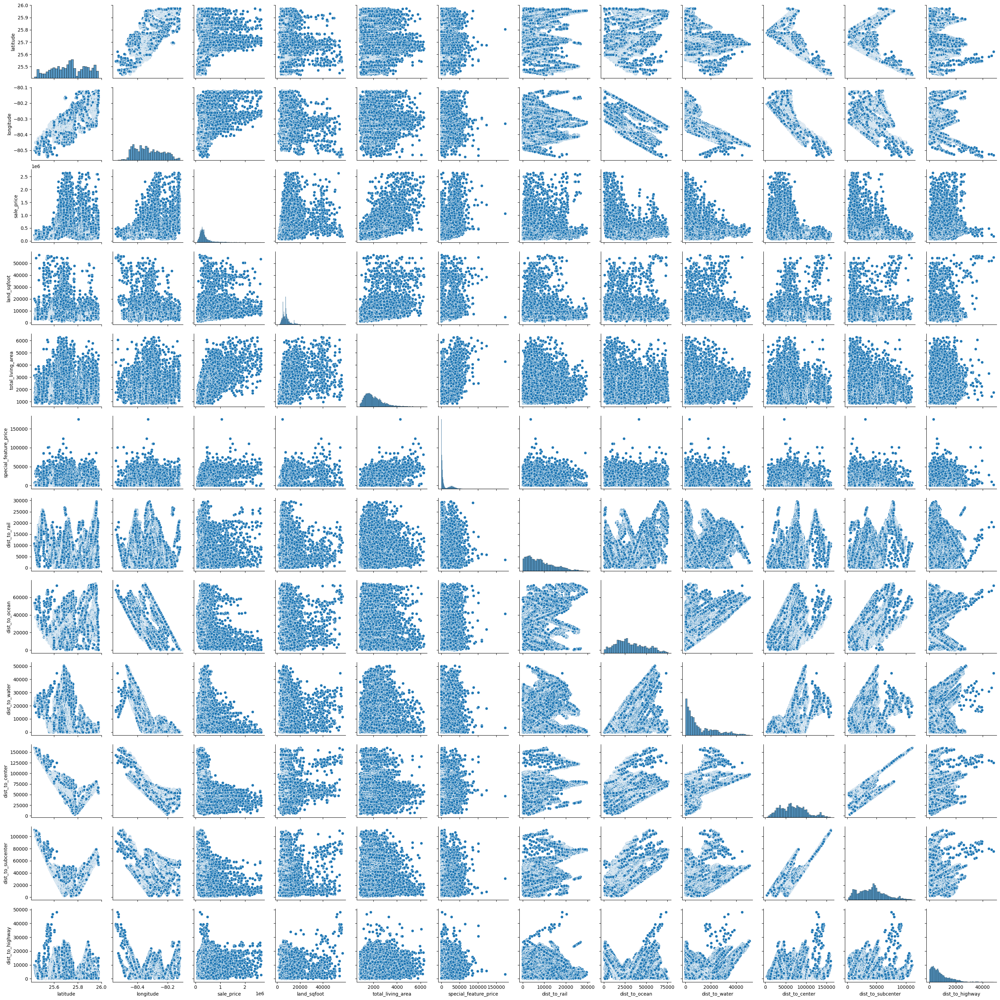

In [113]:
# Pair plots of numeric predictors and response sale price

sns.pairplot(miami_main,vars= ['latitude',
                               'longitude',
                               'sale_price',
 'land_sqfoot',
 'total_living_area',
 'special_feature_price',
 'dist_to_rail',
 'dist_to_ocean',
 'dist_to_water',
 'dist_to_center',
 'dist_to_subcenter',
 'dist_to_highway'])

In [114]:
# correlation plots
corr = miami_main.corr()
corr.style.background_gradient(cmap='coolwarm')
# 'RdBu_r', 'BrBG_r', & PuOr_r are other good diverging colormaps

,latitude,longitude,sale_price,land_sqfoot,total_living_area,special_feature_price,dist_to_rail,dist_to_ocean,dist_to_water,dist_to_center,dist_to_subcenter,dist_to_highway,age,month_sold,structure_quality
latitude,1.000000,0.721232,0.047701,-0.077481,-0.193972,-0.007634,-0.172382,0.242735,-0.423396,-0.717348,-0.195823,-0.113443,0.416967,-0.023634,0.391989
longitude,0.721232,1.000000,0.195274,0.018242,-0.181007,-0.009372,-0.303155,-0.457477,-0.764256,-0.791968,-0.380220,-0.216406,0.488757,-0.010859,0.132893
sale_price,0.047701,0.195274,1.000000,0.363077,0.667301,0.497500,-0.077009,-0.274675,-0.127938,-0.271425,-0.370078,0.231877,-0.123408,0.000325,0.383995
land_sqfoot,-0.077481,0.018242,0.363077,1.000000,0.437472,0.390707,-0.083901,-0.161579,-0.055093,-0.023181,-0.159094,0.130488,0.101244,0.005926,-0.006686
total_living_area,-0.193972,-0.181007,0.667301,0.437472,1.000000,0.506064,0.075486,-0.050141,0.148343,0.136526,-0.044882,0.229497,-0.340606,0.002517,0.173422
special_feature_price,-0.007634,-0.009372,0.497500,0.390707,0.506064,1.000000,-0.021965,-0.055155,0.013923,-0.048817,-0.151916,0.153770,-0.098780,-0.014012,0.188030
dist_to_rail,-0.172382,-0.303155,-0.077009,-0.083901,0.075486,-0.021965,1.000000,0.258966,0.162313,0.444494,0.485468,-0.092495,-0.234515,0.010560,-0.074075
dist_to_ocean,0.242735,-0.457477,-0.274675,-0.161579,-0.050141,-0.055155,0.258966,1.000000,0.490764,0.245396,0.425869,0.093500,-0.159409,-0.012723,0.209497
dist_to_water,-0.423396,-0.764256,-0.127938,-0.055093,0.148343,0.013923,0.162313,0.490764,1.000000,0.526952,0.195280,0.400233,-0.330578,0.010556,-0.034343
dist_to_center,-0.717348,-0.791968,-0.271425,-0.023181,0.136526,-0.048817,0.444494,0.245396,0.526952,1.000000,0.766387,0.076484,-0.548287,0.023096,-0.330588


In [115]:
# distance to center and distance to subcenter are highly correlated and give us redundant information. dropping subcenter predictor
miami_main = miami_main.drop('dist_to_subcenter', axis=1)

In [116]:
bins = range(0, 101, 25)

# Use the cut function to bin the 'values' column
miami_main['age_range'] = pd.cut(miami_main['age'], bins=bins)

In [117]:
# want to make structure quality and month sold into categorical variables
miami_main['structure_quality'] = pd.Categorical(miami_main['structure_quality'])
miami_main['month_sold'] = pd.Categorical(miami_main['month_sold'])

<Axes: xlabel='structure_quality', ylabel='sale_price'>

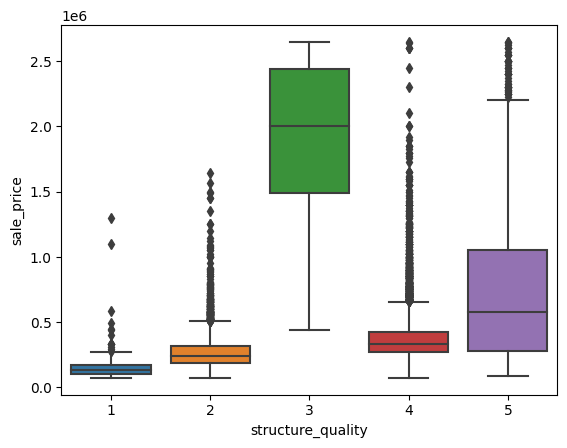

In [118]:
# Exploratory analysis of categorical variables

sns.boxplot(data=miami_main, x="structure_quality", y="sale_price")

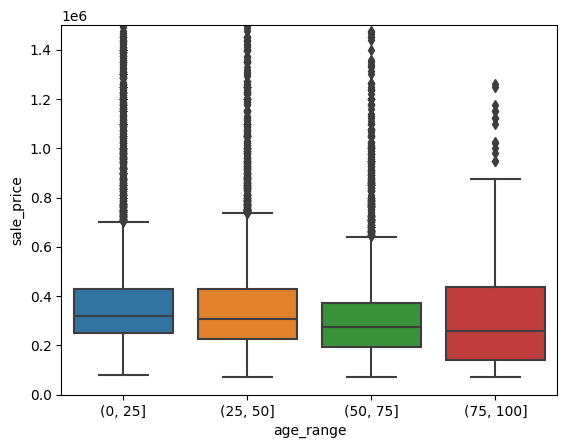

In [119]:
# Create the boxplot
sns.boxplot(data=miami_main, x="age_range", y="sale_price")

# Zoom in on the y-axis
plt.ylim(0, 1500000)  # Set the desired y-axis limits

# Show the plot
plt.show()

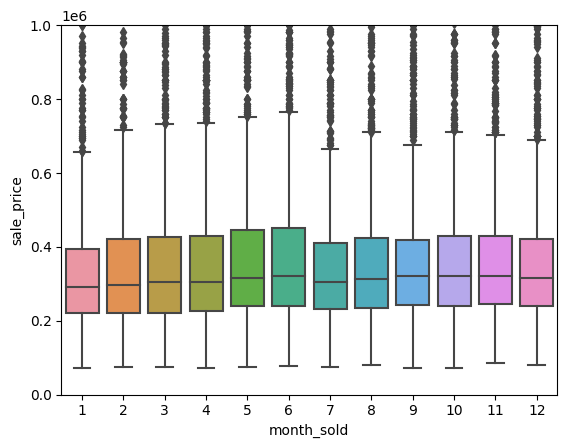

In [120]:
# Create the boxplot
sns.boxplot(data=miami_main, x="month_sold", y="sale_price")

# Zoom in on the y-axis
plt.ylim(0, 1000000)  # Set the desired y-axis limits

# Show the plot
plt.show()

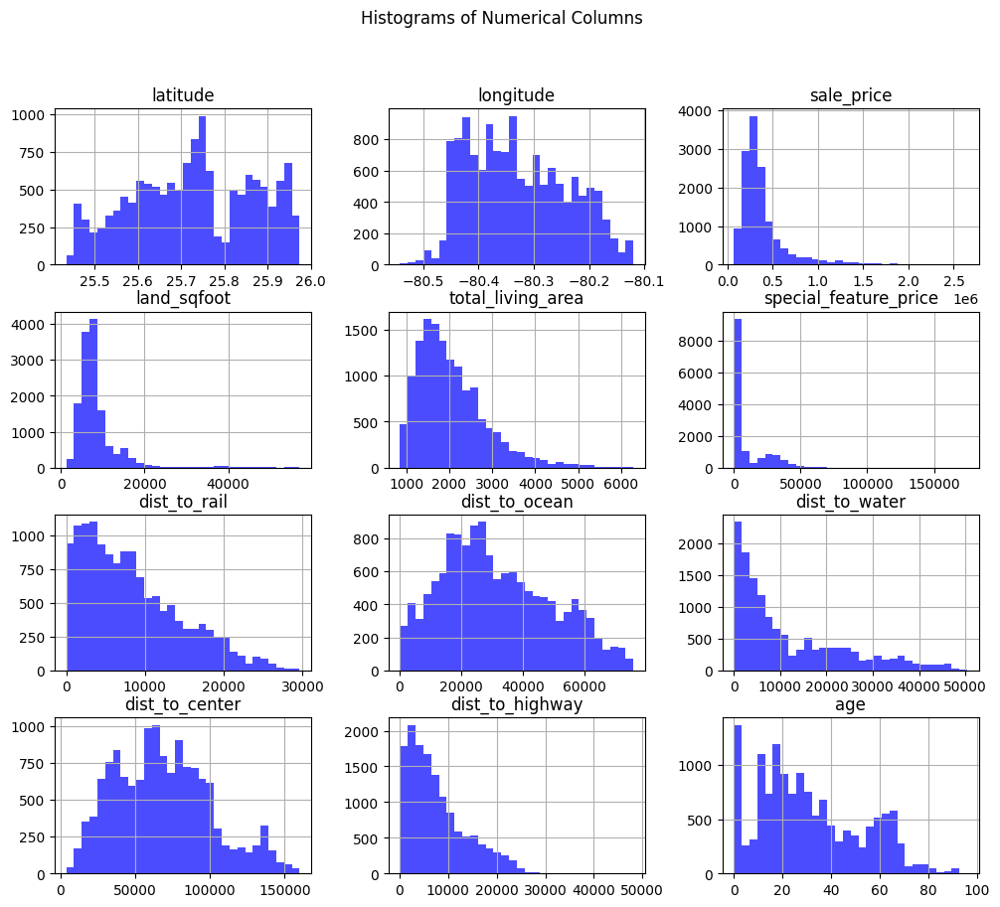

In [121]:
# Select numerical columns
numeric_columns = miami_main.select_dtypes(include=['int', 'float']).columns

# Plot histograms for all numerical columns
miami_main[numeric_columns].hist(bins=30, figsize=(12, 10), color='blue', alpha=0.7)
plt.suptitle('Histograms of Numerical Columns', fontsize=12)
plt.show()

### Introducing Subcounties data

In [122]:
# Create a GeoDataFrame from the main dataset
cousub_gdf = gpd.read_file("tl_2022_12_cousub.shp")
cousub_gdf = cousub_gdf.to_crs("EPSG:4326")

geometry = [Point(xy) for xy in zip(miami_main['longitude'], miami_main['latitude'])]
geo_miami_main_df = gpd.GeoDataFrame(miami_main, geometry=geometry, crs='EPSG:4326')

In [123]:
# Perform spatial join for subcounty-level data
subcounty_result = gpd.sjoin(geo_miami_main_df, cousub_gdf, how='left', op='within')
sqfoot_subcounties = subcounty_result[['land_sqfoot', 'sale_price', 'NAME']]
subcounty_result = subcounty_result[['latitude', 'longitude', 'NAME']]
# Remove duplicates
subcounty_result = subcounty_result.drop_duplicates(subset=['latitude', 'longitude'])

/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py:3473: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if (await self.run_code(code, result,  async_=asy)):


In [124]:
# Merge the result back to the main dataframe
miami_main_loc = pd.merge(miami_main, subcounty_result, on=['latitude', 'longitude'], how='left')
# Renames the columns
miami_main_loc = miami_main_loc.rename(columns={'NAME':'subcounty'})

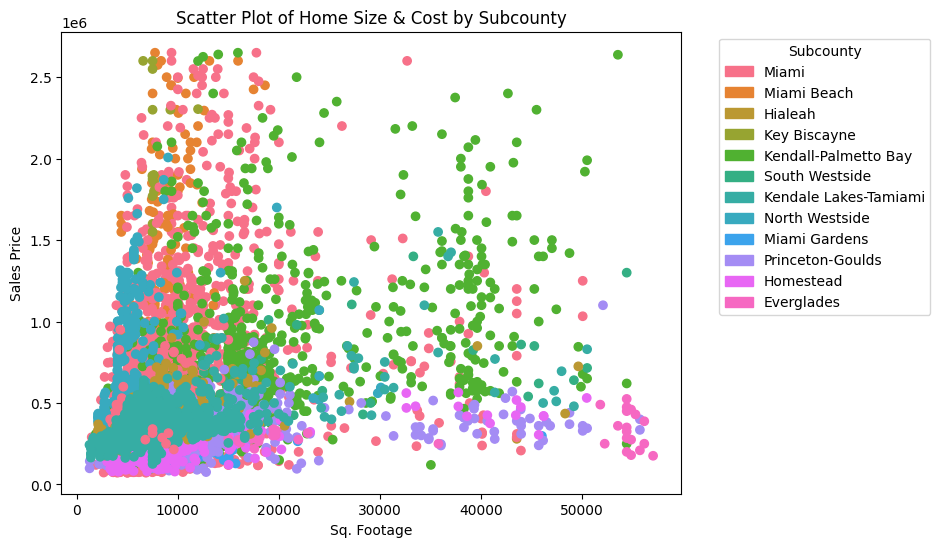

In [125]:
# Create a categorical color map for subcounties
subcounty_colors = sns.color_palette("husl", n_colors=len(sqfoot_subcounties['NAME'].unique()))

# Create a dictionary to map subcounties to colors
subcounty_color_dict = dict(zip(sqfoot_subcounties['NAME'].unique(), subcounty_colors))

# Map subcounty names to colors
sqfoot_subcounties['subcounty_color'] = sqfoot_subcounties['NAME'].map(subcounty_color_dict)

# Set a larger figure size
plt.figure(figsize=(8, 6))

# Scatter plot with colored points by subcounty
scatter = plt.scatter(sqfoot_subcounties['land_sqfoot'], sqfoot_subcounties['sale_price'], c=sqfoot_subcounties['subcounty_color'])

# Add labels and title
plt.xlabel('Sq. Footage')
plt.ylabel('Sales Price')
plt.title('Scatter Plot of Home Size & Cost by Subcounty')

# Create custom legend handles and labels
legend_handles = [Patch(color=subcounty_color_dict[subcounty], label=subcounty) for subcounty in sqfoot_subcounties['NAME'].unique()]

# Add legend outside the plot
plt.legend(handles=legend_handles, title='Subcounty', bbox_to_anchor=(1.05, 1), loc='upper left')

# Show the plot
plt.show()


In [126]:
correlation_matrix = sqfoot_subcounties[['sale_price', 'land_sqfoot']].corr()

print(correlation_matrix)

             sale_price  land_sqfoot
sale_price     1.000000     0.363077
land_sqfoot    0.363077     1.000000


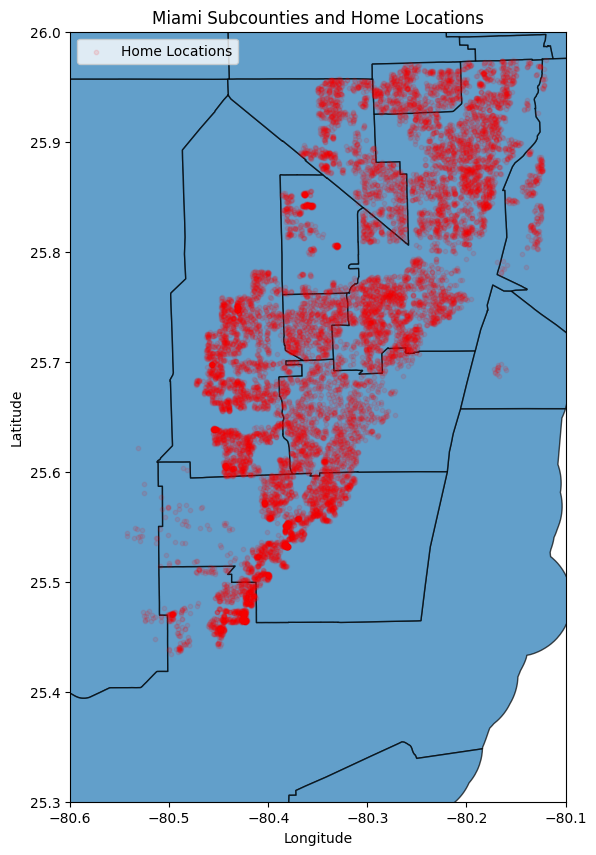

In [127]:
# Plot the subcounty
ax = cousub_gdf.plot(edgecolor='black', figsize=(10, 10), alpha=0.7)

# Plot the home locations
geo_miami_main_df.plot(ax=ax, color='red', marker='o', markersize=10, label='Home Locations', alpha=0.1)

# Set plot title and labels
plt.title('Miami Subcounties and Home Locations')
plt.xlabel('Longitude')
plt.ylabel('Latitude')

# Add a legend
plt.legend()

plt.xlim(-80.6, -80.1)
plt.ylim(25.3, 26.0)

# Show the plot
plt.show()

## Data Preparation: Cleaning

### Variable Generation & Data Type Transformation

In [128]:
# Data preparation
miami_main_loc['subcounty'] = miami_main_loc['subcounty'].astype('category')  # Convert Subcounty to categorical
# Create encoded category
label_encoder = LabelEncoder()
miami_main_loc['subcounty_coded'] = label_encoder.fit_transform(miami_main_loc['subcounty'])

In [129]:
# Shows encoded classes for subcounty
subcounty_classes = miami_main_loc[['subcounty', 'subcounty_coded']].groupby("subcounty").min('subcounty_coded').reset_index()
# Check the group counts for the subcounties
subcounty_counts = pd.DataFrame(miami_main_loc['subcounty_coded'].value_counts()).sort_index()
# Create joined table to subcounty codes and counts
pd.merge(subcounty_classes, subcounty_counts, left_index=True, right_index=True, how='outer').rename(columns={"subcounty_coded_x":"code", "subcounty_coded_y":"counts"})

,subcounty,code,counts
0,Everglades,0,34
1,Hialeah,1,1056
2,Homestead,2,906
3,Kendale Lakes-Tamiami,3,2589
4,Kendall-Palmetto Bay,4,1384
5,Key Biscayne,5,14
6,Miami,6,4154
7,Miami Beach,7,226
8,Miami Gardens,8,672
9,North Westside,9,420


In [130]:
miami_main_loc.columns

Index(['latitude', 'longitude', 'sale_price', 'land_sqfoot',
       'total_living_area', 'special_feature_price', 'dist_to_rail',
       'dist_to_ocean', 'dist_to_water', 'dist_to_center', 'dist_to_highway',
       'age', 'month_sold', 'structure_quality', 'age_range', 'subcounty',
       'subcounty_coded'],
      dtype='object')

In [131]:
# Take numeric predictor variables and use scaling:
scaler = StandardScaler()
miami_main_loc['land_sqfoot'] = scaler.fit_transform(pd.DataFrame(miami_main_loc['land_sqfoot']))
# Log transforms the response variable
miami_main_loc["log_sale_price"] = np.log(miami_main_loc["sale_price"]+.8)

### Train-Test Split

In [132]:
# Separate features, target variable, and group variable (convert to numpy array)
Xs = miami_main_loc[['land_sqfoot', 'subcounty_coded']].to_numpy()
ys = miami_main_loc['log_sale_price'].to_numpy()
grps = miami_main_loc['subcounty_coded'].to_numpy()

# Split the data into training and test sets, ensuring that the rare classes are represented in both sets (makes arrays)
X_train, X_test, y_train, y_test = train_test_split(Xs, ys, test_size=0.1, random_state=2023, stratify=grps)

# Create a joined dataframe of the training data arrays
X_train_df = pd.DataFrame({"land_sqfoot":X_train[:,0], "subcounty_coded":X_train[:,1], "log_sale_price":y_train})
# Create a joined dataframe of the testing data arrays
X_test_df = pd.DataFrame({"land_sqfoot":X_test[:,0], "subcounty_coded":X_test[:,1]})
y_test_df = pd.DataFrame({"log_sale_price":y_test})
# Convert group data to integer
X_train_df['subcounty_coded'] = X_train_df['subcounty_coded'].astype(np.int64)
X_test_df['subcounty_coded'] = X_test_df['subcounty_coded'].astype(np.int64)

## Modeling: Bayesian Linear Regressions

### Partial Pooling: Hierarchical Model

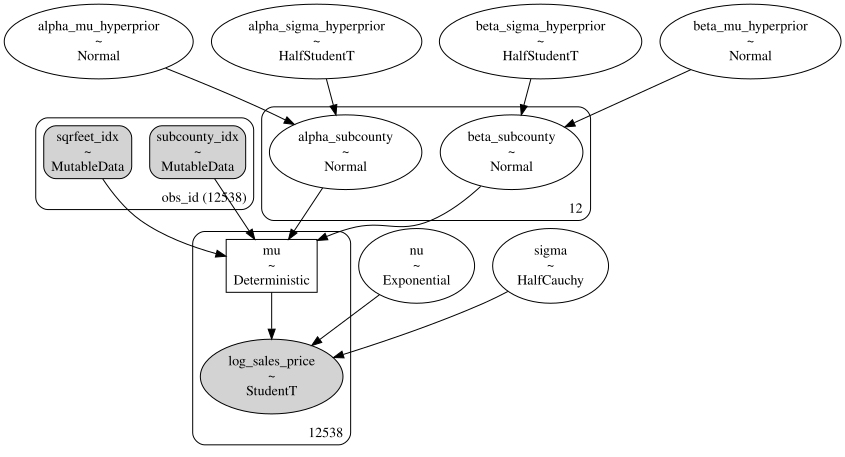

In [133]:
with pm.Model() as partial_pooling:

    # Predictors:
    subcounty_idx = pm.Data("subcounty_idx", X_train_df['subcounty_coded'].values, dims="obs_id", mutable=True)
    sqrfeet_idx = pm.Data("sqrfeet_idx", X_train_df['land_sqfoot'].values, dims="obs_id", mutable=True)

    # Hyperpriors:
    alpha_mu_hyperprior = pm.Normal("alpha_mu_hyperprior", mu=0.0, sigma=10.0)
    #alpha_sigma_hyperprior = pm.HalfNormal('alpha_sigma_hyperprior',sigma=20.0)
    alpha_sigma_hyperprior = pm.HalfStudentT('alpha_sigma_hyperprior',nu=1, sigma=2.0)
    beta_mu_hyperprior = pm.Normal("beta_mu_hyperprior", mu=0.0, sigma=20.0)
    #beta_sigma_hyperprior = pm.HalfNormal('beta_sigma_hyperprior', sigma=20.0)
    beta_sigma_hyperprior = pm.HalfStudentT('beta_sigma_hyperprior',nu=1, sigma=2.0)
    #sigma_hyperprior = pm.HalfNormal("sigma_hyperprior", sigma=20.0)

    # Set varying Alpha
    alpha_subcounty = pm.Normal('alpha_subcounty', mu = alpha_mu_hyperprior, sigma = alpha_sigma_hyperprior, shape=len(pd.unique(X_train_df['subcounty_coded'])))
    # Varying beta and sigma for subcounty:
    beta_subcounty = pm.Normal("beta_subcounty", mu=beta_mu_hyperprior, sigma=beta_sigma_hyperprior, shape=len(pd.unique(X_train_df['subcounty_coded'])))
    #sigma = pm.HalfNormal("sigma", sigma_hyperprior)
    #sigma = pm.HalfNormal("sigma", sigma=20.0)
    #sigma = pm.InverseGamma("sigma", alpha=1.0, beta=1.0)
    sigma = pm.HalfCauchy('sigma',beta=1.0)
    nu = pm.Exponential('nu', 1/29.0)+ 1 # uninformed prior

    # Expected value per observation:
    # Regression
    mu_val = alpha_subcounty[subcounty_idx] + (beta_subcounty[subcounty_idx] * sqrfeet_idx)

    mu = pm.Deterministic("mu", mu_val)

    # Distribution of Sales price
    sales_price = pm.StudentT("log_sales_price", nu=nu, mu=mu, sigma=sigma, observed=X_train_df['log_sale_price'].values)

    # For comparison
    partial_pooling_trace = pm.sample(1500, tune=750, cores=4, random_seed = 2023, return_inferencedata=False, step=pm.NUTS(target_accept=0.99))

# Generate inference data
partial_pool_idata = pm.to_inference_data(trace=partial_pooling_trace, model=partial_pooling, log_likelihood=True)

# Generate model visual
pm.model_to_graphviz(partial_pooling)

#### Summary of Parameters

In [134]:
# Select parameters of interest
param_of_interest = ['alpha_mu_hyperprior', 'alpha_sigma_hyperprior', 'beta_mu_hyperprior', 'beta_sigma_hyperprior', 'alpha_subcounty', 'beta_subcounty', 'sigma', 'nu']
# Show summary table
az.summary(partial_pool_idata.posterior, var_names=param_of_interest, round_to=2)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
alpha_mu_hyperprior,12.92,0.23,12.49,13.34,0.0,0.0,5744.03,3236.37,1.0
alpha_sigma_hyperprior,0.75,0.19,0.45,1.11,0.0,0.0,6599.47,3922.21,1.0
beta_mu_hyperprior,0.22,0.08,0.07,0.39,0.0,0.0,6152.72,3974.08,1.0
beta_sigma_hyperprior,0.27,0.08,0.15,0.40,0.0,0.0,6084.81,4140.00,1.0
alpha_subcounty[0],12.57,0.10,12.39,12.75,0.0,0.0,4700.98,4275.49,1.0
alpha_subcounty[1],12.69,0.01,12.66,12.71,0.0,0.0,5377.01,4180.56,1.0
alpha_subcounty[2],12.36,0.01,12.34,12.39,0.0,0.0,8578.42,4853.16,1.0
alpha_subcounty[3],12.81,0.01,12.79,12.82,0.0,0.0,6488.76,4760.73,1.0
alpha_subcounty[4],12.81,0.01,12.79,12.84,0.0,0.0,5987.82,4828.87,1.0
alpha_subcounty[5],14.53,0.09,14.37,14.69,0.0,0.0,7225.37,4531.09,1.0


#### Sampling Evaluation

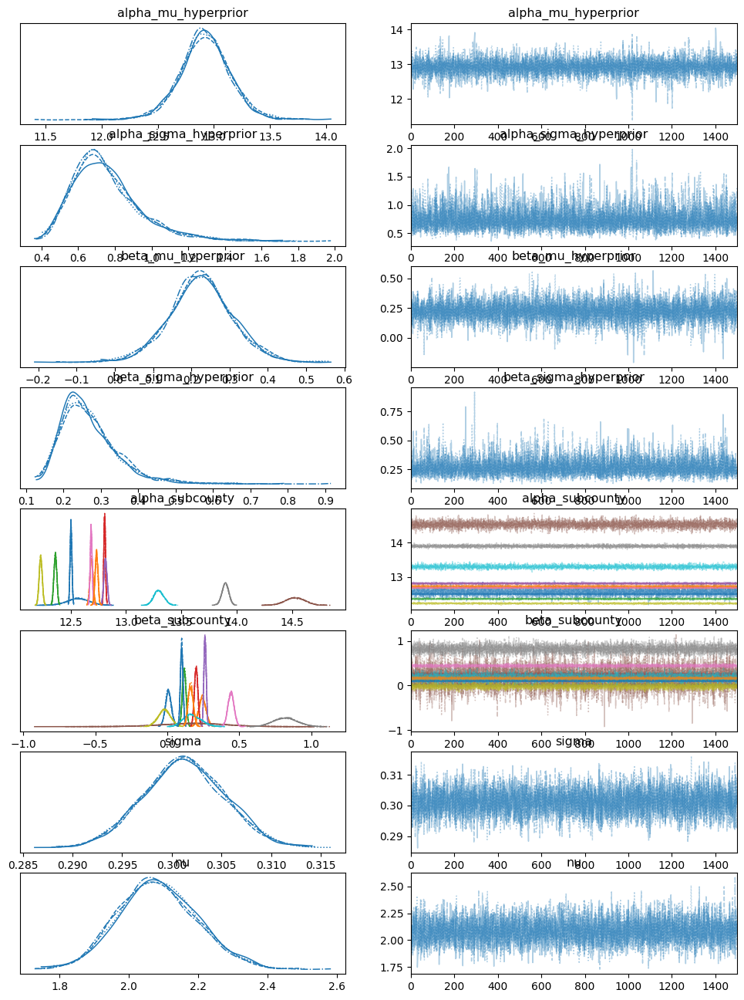

In [135]:
# Trace plot for evaluating sampling
pm.plot_trace(partial_pool_idata, var_names=param_of_interest, compact = True);

#### Prior Check

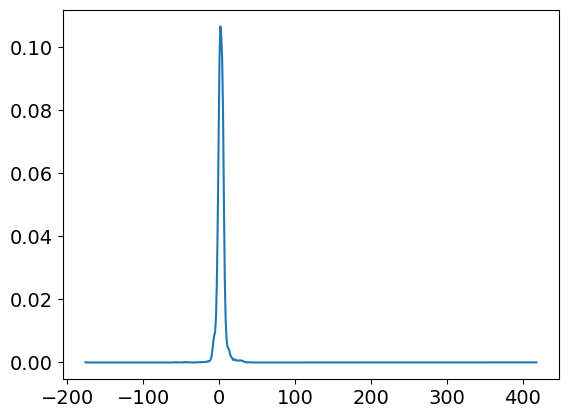

In [136]:
# Prior checks
partial_pooling_ppc = pm.sample_prior_predictive(model = partial_pooling, random_seed=2023)
# Predicted sales price with prior
az.plot_dist(partial_pooling_ppc.prior_predictive['log_sales_price'].mean(dim=['chain','draw']));

#### Posterior Check

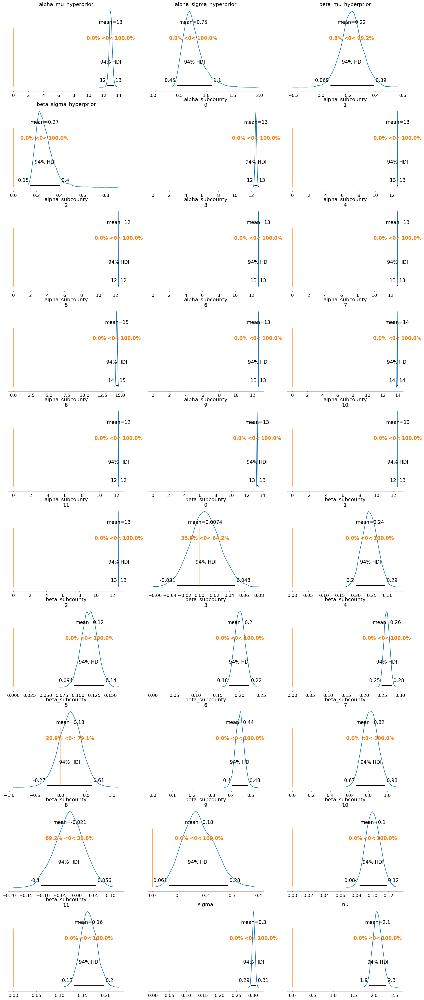

In [137]:
# Show the posterior distributions
az.plot_posterior(partial_pool_idata, var_names=param_of_interest, ref_val = 0,);

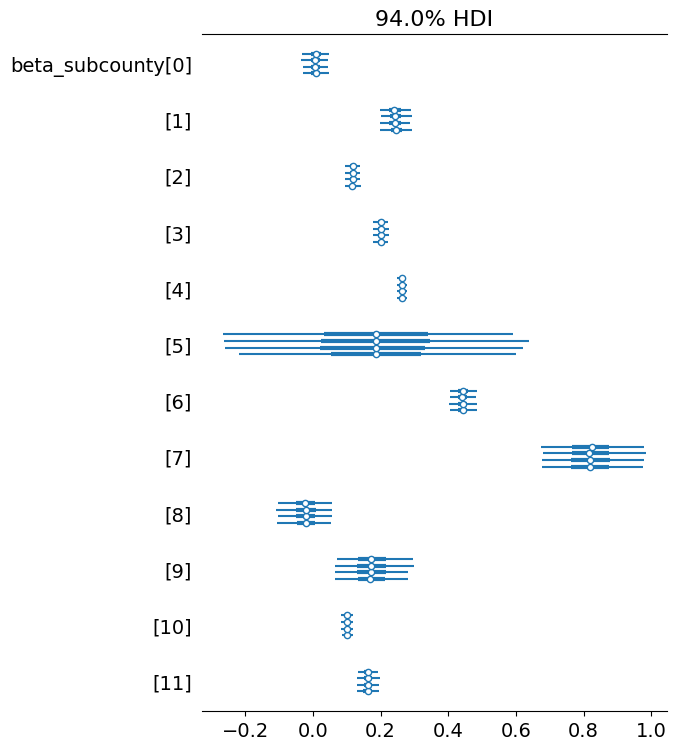

In [138]:
# Beta parameters for each sub-county
az.plot_forest(partial_pool_idata, var_names=['beta_subcounty']);

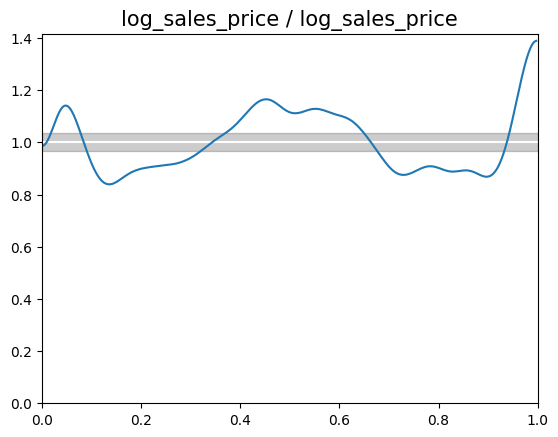

In [139]:
# Check Bayesian p-value to see posterior predictive performance
partial_pooling_pp = pm.sample_posterior_predictive(partial_pool_idata, model = partial_pooling, random_seed=2023)
az.plot_bpv(partial_pooling_pp);

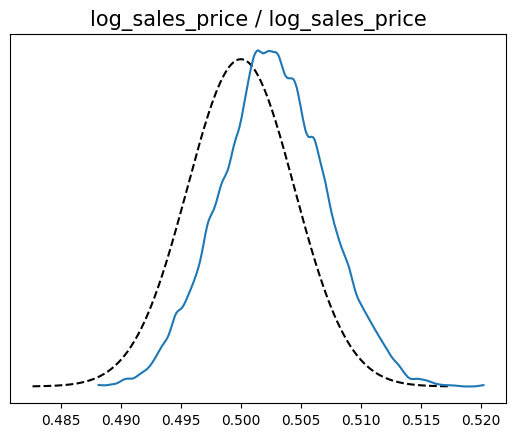

In [140]:
# Plot the Bayesian p-value distribution
az.plot_bpv(partial_pooling_pp, kind="p_value");

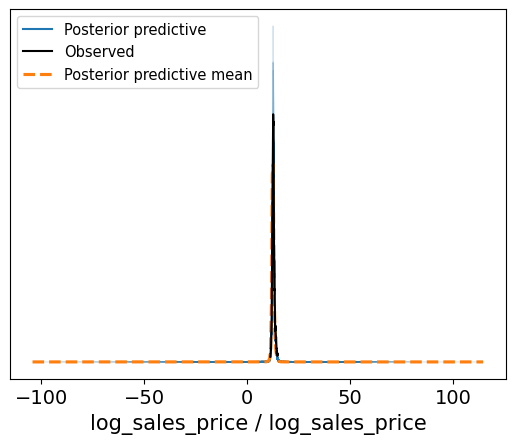

In [141]:
# Examine the posterior predictive distribution against actual
az.plot_ppc(partial_pooling_pp);

### Full Pooling: Single Model (no Sub-County)

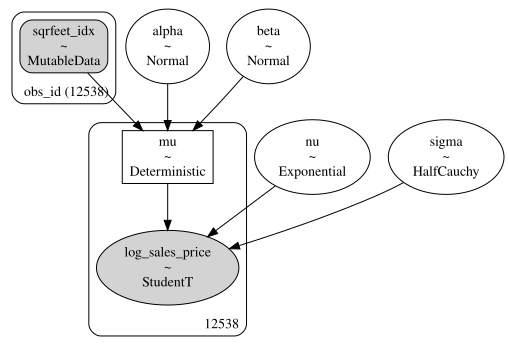

In [142]:
with pm.Model() as full_pooling:

    # Predictors:
    sqrfeet_idx = pm.Data("sqrfeet_idx", X_train_df['land_sqfoot'].values, dims="obs_id", mutable=True)

    # Set the Alpha
    alpha = pm.Normal('alpha', mu = np.mean(X_train_df['log_sale_price']), sigma = 20.0)
    # Single beta and sigma:
    beta = pm.Normal("beta", mu=0.0, sigma=200.0)
    #sigma = pm.HalfNormal("sigma", sigma=20.0)
    #sigma = pm.InverseGamma("sigma", alpha=2.0, beta=3.0)
    sigma = pm.HalfCauchy('sigma',beta=2.0)
    nu = pm.Exponential('nu', 1/29.0)+ 1 # uninformed prior

    # Expected value per observation:
    mu_val = alpha + (beta * sqrfeet_idx)

    mu = pm.Deterministic("mu", mu_val)

    # Data likelihood
    sales_price = pm.StudentT("log_sales_price", nu=nu, mu=mu, sigma=sigma, observed=X_train_df['log_sale_price'].values)

    # For comparison
    full_pooling_trace = pm.sample(1500, tune=1750, cores =4, random_seed = 2023, return_inferencedata=False, step=pm.NUTS(target_accept=0.99))

# Generate inference data
full_pool_idata = pm.to_inference_data(trace=full_pooling_trace, model=full_pooling, log_likelihood=True)

# Generate model visual
pm.model_to_graphviz(full_pooling)

#### Summary of Parameters

In [143]:
# Select parameters of interest
param_of_interest = ['alpha', 'beta', 'sigma', 'nu']
# Show summary table
az.summary(full_pool_idata.posterior, var_names=param_of_interest, round_to=2)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
alpha,12.68,0.00,12.68,12.69,0.0,0.0,4012.86,3314.28,1.0
beta,0.23,0.01,0.23,0.24,0.0,0.0,4128.57,3986.45,1.0
sigma,0.39,0.00,0.38,0.39,0.0,0.0,3066.35,3570.40,1.0
nu,2.79,0.15,2.52,3.08,0.0,0.0,3008.50,3598.02,1.0


#### Sampling Evaluation

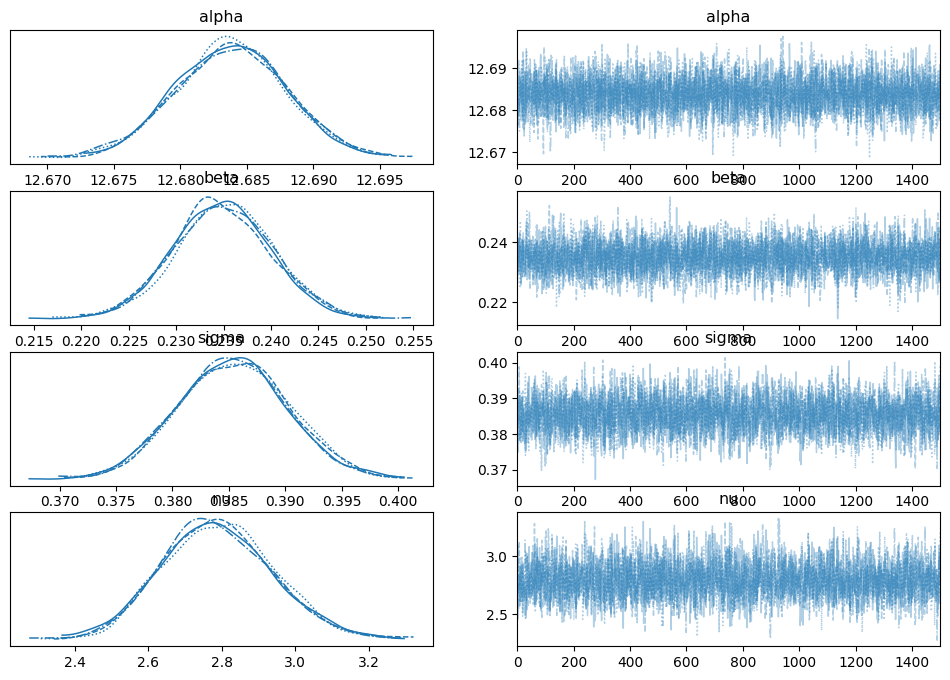

In [144]:
# Trace plot for evaluating sampling
pm.plot_trace(full_pool_idata, var_names=param_of_interest, compact = True);

#### Prior Check

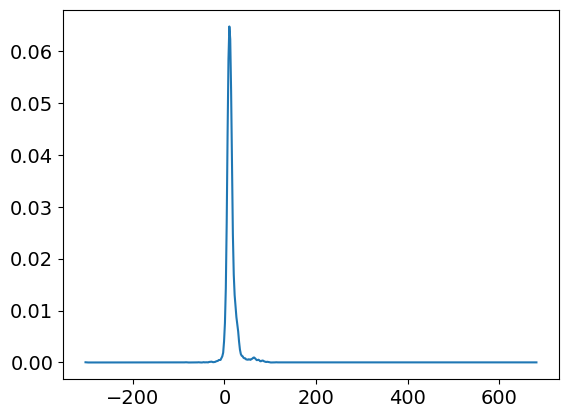

In [145]:
# Prior checks
full_pooling_ppc = pm.sample_prior_predictive(model = full_pooling, random_seed=2023)
# Predicted sales price with prior
az.plot_dist(full_pooling_ppc.prior_predictive['log_sales_price'].mean(dim=['chain','draw']));

#### Posterior Check

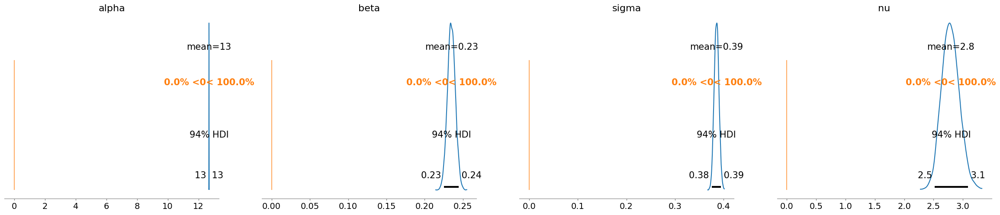

In [146]:
# Show the posterior distributions
az.plot_posterior(full_pool_idata, var_names=param_of_interest, ref_val = 0,);

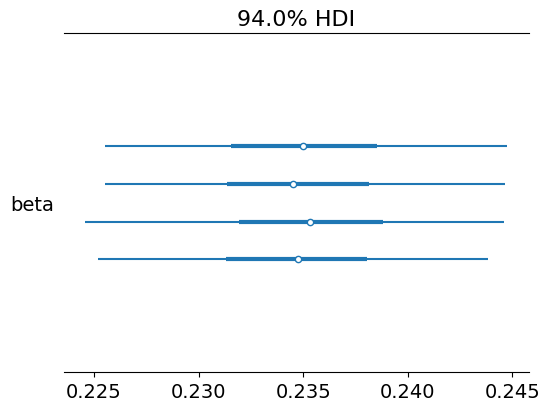

In [147]:
# Beta parameters
az.plot_forest(full_pool_idata, var_names=['beta']);

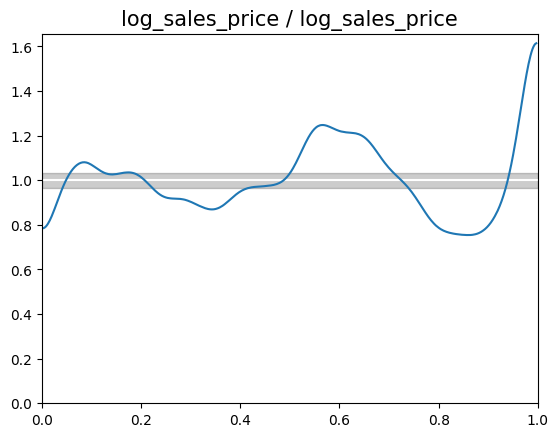

In [148]:
# Check Bayesian p-value to see posterior predictive performance
full_pooling_pp = pm.sample_posterior_predictive(full_pooling_trace, model = full_pooling, random_seed=2023)
az.plot_bpv(full_pooling_pp);

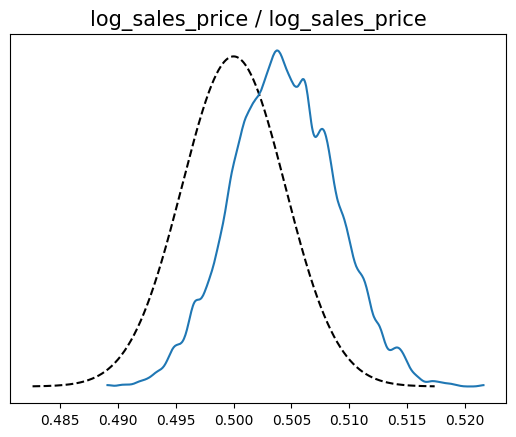

In [149]:
# Plot the Bayesian p-value distribution
az.plot_bpv(full_pooling_pp, kind="p_value");

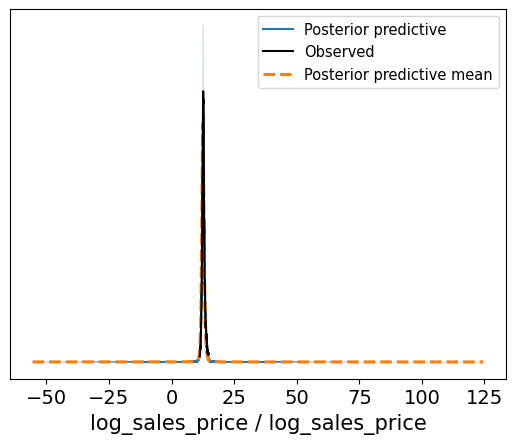

In [150]:
# Examine the posterior predictive distribution against actual
az.plot_ppc(full_pooling_pp);

### No Pooling: Seperate Models for Sub-County

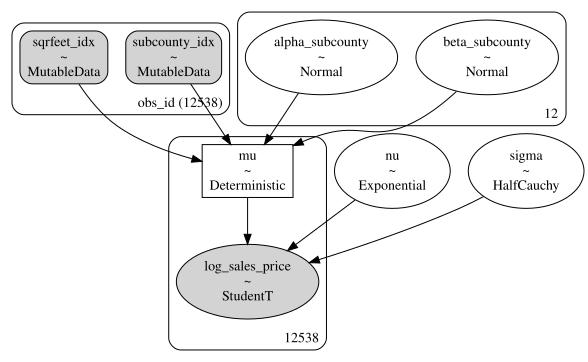

In [151]:
with pm.Model() as no_pooling:

    # Predictors:
    subcounty_idx = pm.Data("subcounty_idx", X_train_df['subcounty_coded'].values, dims="obs_id", mutable=True)
    sqrfeet_idx = pm.Data("sqrfeet_idx", X_train_df['land_sqfoot'].values, dims="obs_id", mutable=True)

    # Varying alpha, beta, and sigma for subcounty:
    alpha_subcounty = pm.Normal('alpha_subcounty', mu = np.mean(X_train_df['log_sale_price']), sigma = 20.0, shape=len(pd.unique(X_train_df['subcounty_coded'])))
    beta_subcounty = pm.Normal("beta_subcounty", mu=0.0, sigma=200.0, shape=len(pd.unique(X_train_df['subcounty_coded'])))
    #sigma = pm.HalfNormal("sigma",  sigma=20.0)
    #sigma = pm.InverseGamma("sigma", alpha=2.0, beta=3.0)
    sigma = pm.HalfCauchy('sigma',beta=2.0)
    nu = pm.Exponential('nu', 1/29.0)+ 1 # uninformed prior

    # Expected value per observation:
    mu_val = alpha_subcounty[subcounty_idx] + (beta_subcounty[subcounty_idx] * sqrfeet_idx)

    mu = pm.Deterministic("mu", mu_val)

    # Data likelihood
    sales_price = pm.StudentT("log_sales_price", nu=nu, mu=mu, sigma=sigma, observed=X_train_df['log_sale_price'].values)

    # For comparison
    no_pooling_trace = pm.sample(1000, tune=2000, cores=4, random_seed = 2023, return_inferencedata=False, step=pm.NUTS(target_accept=0.99))

# Generate inference data
no_pool_idata = pm.to_inference_data(trace=no_pooling_trace, model=no_pooling, log_likelihood=True)

# Generate model visual
pm.model_to_graphviz(no_pooling)

#### Summary of Parameters

In [152]:
# Select parameters of interest
param_of_interest = ['alpha_subcounty', 'beta_subcounty', 'sigma', 'nu']
# Show summary table
az.summary(no_pool_idata.posterior, var_names=param_of_interest, round_to=2)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
alpha_subcounty[0],12.56,0.10,12.38,12.74,0.00,0.00,3192.15,2928.44,1.0
alpha_subcounty[1],12.69,0.01,12.66,12.72,0.00,0.00,3377.70,3074.11,1.0
alpha_subcounty[2],12.36,0.01,12.34,12.38,0.00,0.00,7312.07,3159.50,1.0
alpha_subcounty[3],12.81,0.01,12.79,12.82,0.00,0.00,4955.05,3330.33,1.0
alpha_subcounty[4],12.81,0.01,12.79,12.84,0.00,0.00,4340.97,3576.82,1.0
alpha_subcounty[5],14.55,0.10,14.35,14.74,0.00,0.00,4537.50,3096.28,1.0
alpha_subcounty[6],12.69,0.01,12.67,12.70,0.00,0.00,6479.95,3113.21,1.0
alpha_subcounty[7],13.91,0.03,13.85,13.97,0.00,0.00,5611.67,2760.43,1.0
alpha_subcounty[8],12.23,0.01,12.20,12.25,0.00,0.00,6344.74,3504.52,1.0
alpha_subcounty[9],13.30,0.05,13.21,13.38,0.00,0.00,3185.41,2698.18,1.0


#### Sampling Evaluation

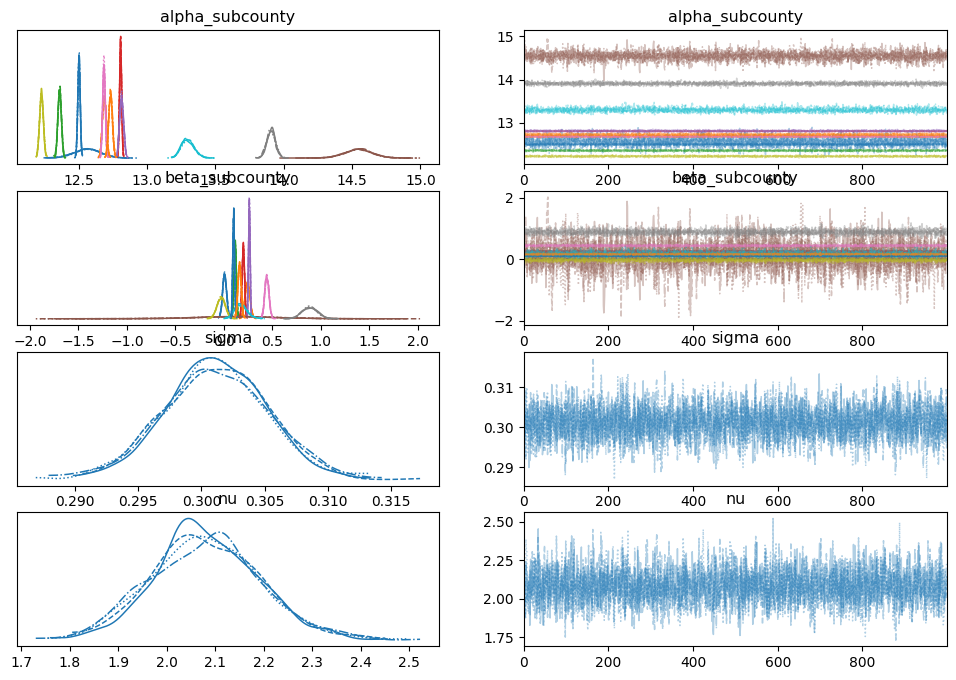

In [153]:
# Trace plot for evaluating sampling
pm.plot_trace(no_pool_idata, var_names=param_of_interest, compact = True);

#### Prior Check

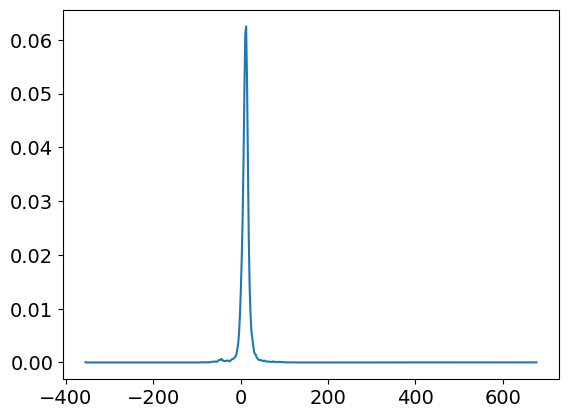

In [154]:
# Prior checks
no_pooling_ppc = pm.sample_prior_predictive(model = no_pooling, random_seed=2023)
# Predicted sales price with prior
az.plot_dist(no_pooling_ppc.prior_predictive['log_sales_price'].mean(dim=['chain','draw']));

#### Posterior Check

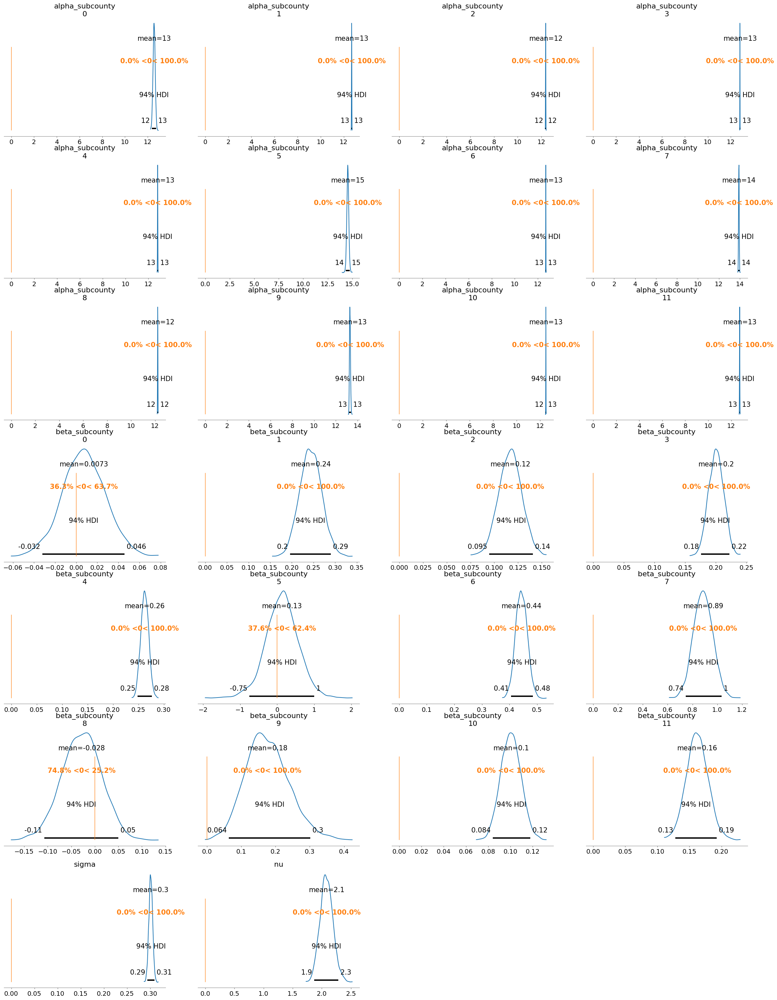

In [155]:
# Show the posterior distributions
az.plot_posterior(no_pool_idata, var_names=param_of_interest, ref_val = 0,);

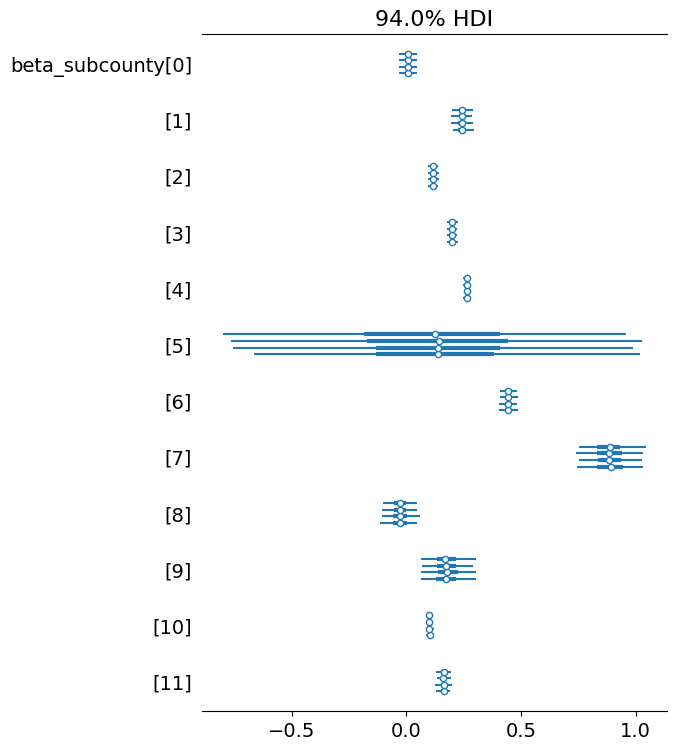

In [156]:
# Beta parameters for each subcounty
az.plot_forest(no_pool_idata, var_names=['beta_subcounty']);

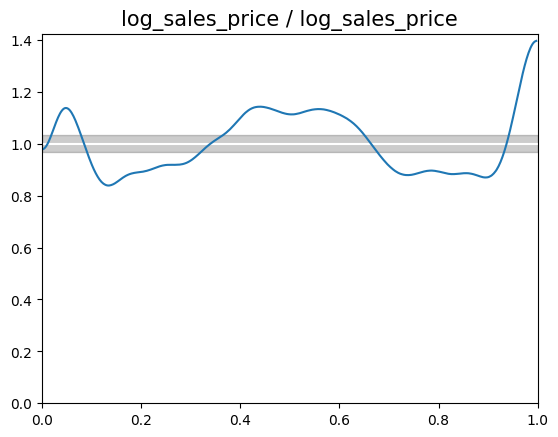

In [157]:
# Check Bayesian p-value to see posterior predictive performance
no_pooling_pp = pm.sample_posterior_predictive(no_pooling_trace, model = no_pooling, random_seed=2023)
az.plot_bpv(no_pooling_pp);

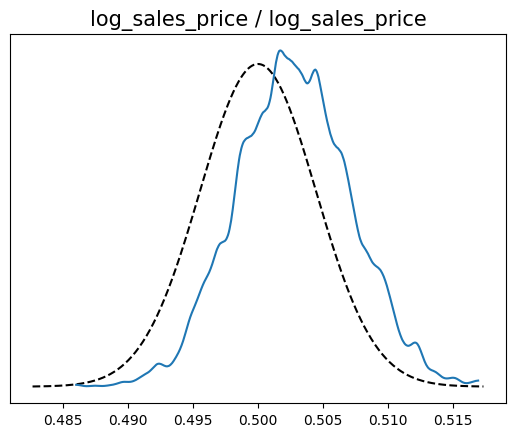

In [158]:
# Plot the Bayesian p-value distribution
az.plot_bpv(no_pooling_pp, kind="p_value");

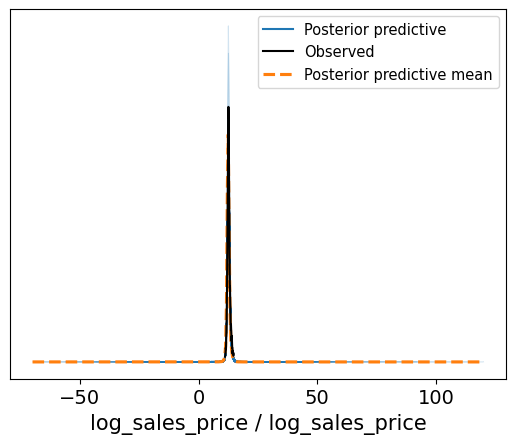

In [159]:
# Examine the posterior predictive distribution against actual
az.plot_ppc(no_pooling_pp);

## Evaluation: Model Comparisons

### Comparison using WAIC

In [160]:
# WAIC Comparison
cmp_df = az.compare({'Partial Pooled':partial_pool_idata, 'Full Pooled':full_pool_idata, 'No Pooled':no_pool_idata}, ic='waic')
cmp_df

/usr/local/lib/python3.10/dist-packages/arviz/stats/stats.py:1645: UserWarning: For one or more samples the posterior variance of the log predictive densities exceeds 0.4. This could be indication of WAIC starting to fail. 
See http://arxiv.org/abs/1507.04544 for details
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/arviz/stats/stats.py:1645: UserWarning: For one or more samples the posterior variance of the log predictive densities exceeds 0.4. This could be indication of WAIC starting to fail. 
See http://arxiv.org/abs/1507.04544 for details
  warnings.warn(


,rank,elpd_waic,p_waic,elpd_diff,weight,se,dse,warning,scale
Partial Pooled,0,-7087.661224,35.558124,0.000000,0.680220,114.331363,0.000000,True,log
No Pooled,1,-7088.155854,36.310196,0.494631,0.302415,114.363772,1.243774,True,log
Full Pooled,2,-9330.878557,4.693830,2243.217334,0.017365,108.137068,72.144815,False,log


<Axes: title={'center': 'Model comparison\nhigher is better'}, xlabel='elpd_waic (log)', ylabel='ranked models'>

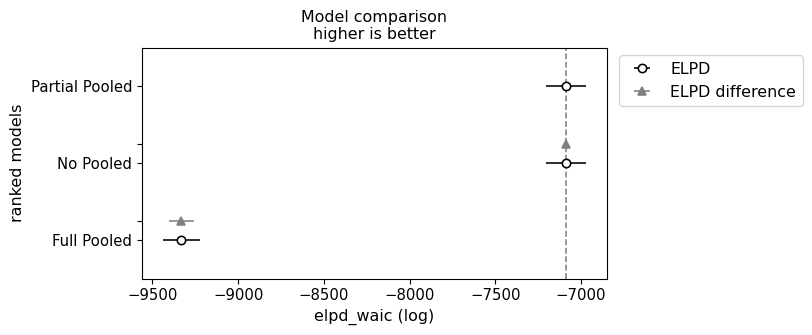

In [161]:
# Plots the WAIC Comparison
az.plot_compare(cmp_df)

### Comparison using LOO

In [162]:
# LOO Comparison
cmp_df = az.compare({'Partial Pooled':partial_pool_idata, 'Full Pooled':full_pool_idata, 'No Pooled':no_pool_idata}, ic='loo')
cmp_df

,rank,elpd_loo,p_loo,elpd_diff,weight,se,dse,warning,scale
Partial Pooled,0,-7087.664233,35.561134,0.000000,0.745476,114.331044,0.000000,False,log
No Pooled,1,-7088.280563,36.434905,0.616330,0.237209,114.363642,1.288893,False,log
Full Pooled,2,-9330.882601,4.697874,2243.218368,0.017316,108.137106,72.143660,False,log


<Axes: title={'center': 'Model comparison\nhigher is better'}, xlabel='elpd_loo (log)', ylabel='ranked models'>

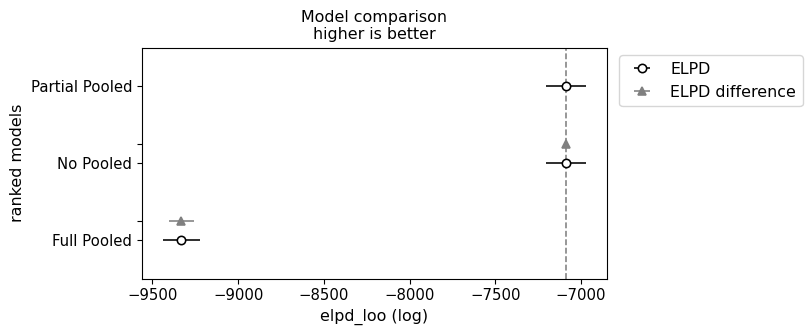

In [163]:
# Plots the LOO Comparison
az.plot_compare(cmp_df)

### Prediction on Test Set

#### Hierarchical Model

In [164]:
# OOS values
xtest_subcounty = X_test_df['subcounty_coded']
xtest_sqfoot = X_test_df['land_sqfoot']
ytest_saleprice = y_test_df['log_sale_price']
true_slope, true_intercept = np.polyfit(xtest_sqfoot, ytest_saleprice, 1)
# Predictions
with partial_pooling:
    # Provide new data
    pm.set_data({"subcounty_idx":xtest_subcounty,
                 "sqrfeet_idx":xtest_sqfoot})

    parpool_posterior_predictions = pm.sample_posterior_predictive(partial_pool_idata, var_names=["mu"], return_inferencedata=True,
                                                           predictions=True, extend_inferencedata=True, random_seed=2023)

In [165]:
# Calculate prediction performance metrics
mse = mean_squared_error(ytest_saleprice, parpool_posterior_predictions.predictions.mu_dim_2.values)
print("Hierarchical Model - Mean Squared Error:", round(mse,3))
rmse = np.sqrt(mse)
print("Hierarchical Model - Root Mean Squared Error:", round(rmse,3))

Hierarchical Model - Mean Squared Error: 629486.579
Hierarchical Model - Root Mean Squared Error: 793.402


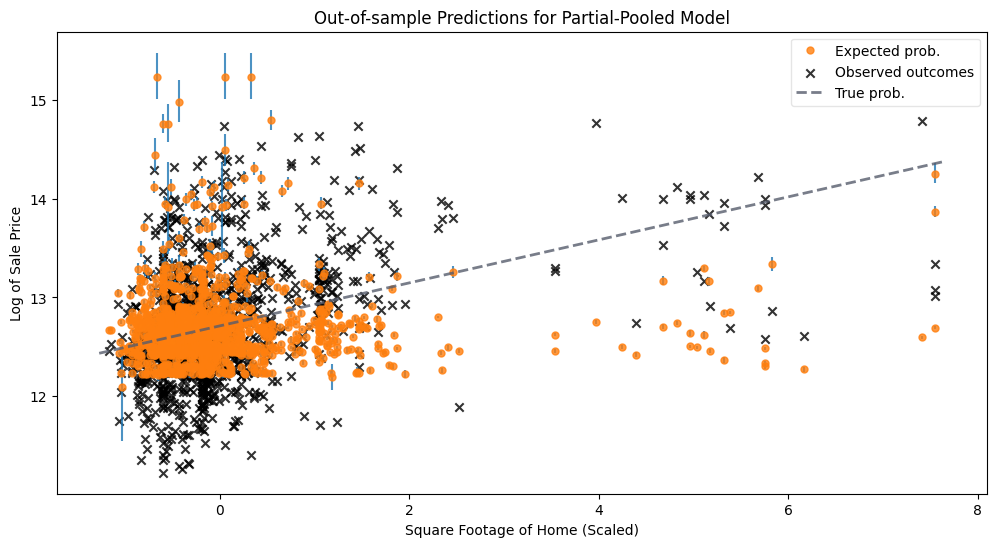

In [166]:
_, ax = plt.subplots(figsize=(12, 6))

preds_out_of_sample = parpool_posterior_predictions.predictions_constant_data.sortby("sqrfeet_idx")["sqrfeet_idx"]
model_preds = parpool_posterior_predictions.predictions.sortby('mu_dim_2')

# uncertainty about the estimates:
ax.vlines(
    preds_out_of_sample,
    *az.hdi(model_preds)["mu"].transpose("hdi", ...),
    alpha=0.8,
)
# expected probability of success:
ax.plot(
    preds_out_of_sample,
    model_preds["mu"].mean(("chain", "draw")),
    "o",
    ms=5,
    color="C1",
    alpha=0.8,
    label="Expected prob.",
)

# actual outcomes:
ax.scatter(
    x=xtest_sqfoot,
    y=ytest_saleprice,
    marker="x",
    color="k",
    alpha=0.8,
    label="Observed outcomes",
)
# true probabilities:
x = np.linspace(xtest_sqfoot.min() - 0.1, xtest_sqfoot.max() + 0.1)
ax.plot(
    x,
    (true_intercept + true_slope * x),
    lw=2,
    ls="--",
    color="#565C6C",
    alpha=0.8,
    label="True prob.",
)

ax.set_xlabel("Square Footage of Home (Scaled)")
ax.set_ylabel("Log of Sale Price")
ax.set_title("Out-of-sample Predictions for Partial-Pooled Model")
ax.legend(fontsize=10, frameon=True, framealpha=0.5);

Text(0, 0.5, 'Log of Sale Price')

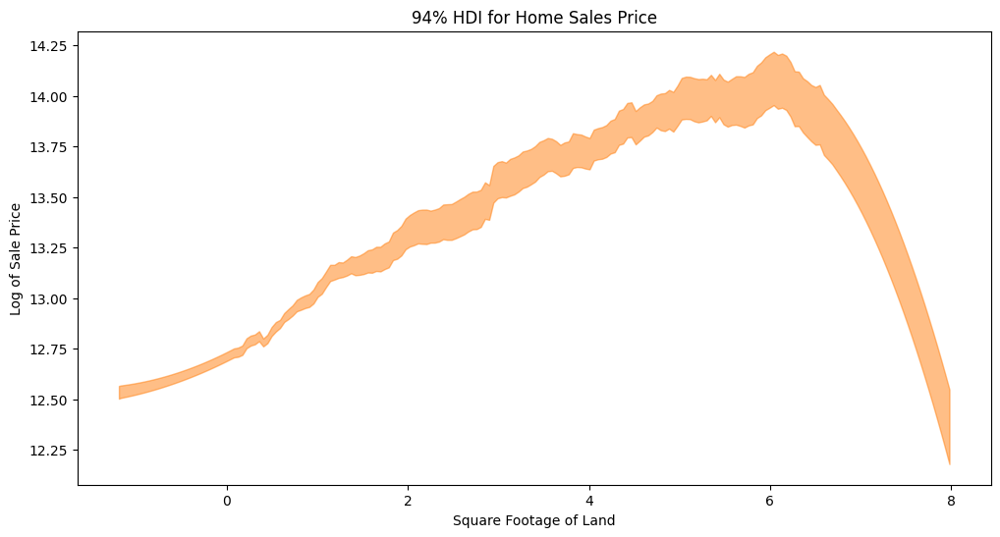

In [180]:
_, ax = plt.subplots(figsize=(12, 6))
rates = parpool_posterior_predictions.posterior["mu"]
az.plot_hdi(X_train_df['land_sqfoot'], rates, smooth=True, hdi_prob=0.94)
rate_mean = parpool_posterior_predictions.posterior["mu"].mean(dim=["draw", "chain"])
ax.set_title("Hierarchical Model - 94% HDI for Home Sales Price")
ax.set_xlabel("Square Footage (Standardized)")
ax.set_ylabel("Log of Sale Price");

#### Pooled Model

In [167]:
# OOS values
xtest_subcounty = X_test_df['subcounty_coded']
xtest_sqfoot = X_test_df['land_sqfoot']
ytest_saleprice = y_test_df['log_sale_price']
true_slope, true_intercept = np.polyfit(xtest_sqfoot, ytest_saleprice, 1)
# Predictions
with full_pooling:
    # Provide new data
    pm.set_data({"sqrfeet_idx":xtest_sqfoot})

    fullpool_posterior_predictions = pm.sample_posterior_predictive(full_pool_idata, var_names=["mu"], return_inferencedata=True,
                                                           predictions=True, extend_inferencedata=True, random_seed=2023)

In [168]:
# Calculate prediction performance metrics
mse = mean_squared_error(ytest_saleprice, fullpool_posterior_predictions.predictions.mu_dim_2.values)
print("Pooled Model - Mean Squared Error:", round(mse,3))
rmse = np.sqrt(mse)
print("Pooled Model - Root Mean Squared Error:", round(rmse,3))

Pooled Model - Mean Squared Error: 629486.579
Pooled Model - Root Mean Squared Error: 793.402


In [184]:
print("parpool", parpool_posterior_predictions.predictions.mu_dim_2.values)
print("full", fullpool_posterior_predictions.predictions.mu_dim_2.values)
print("un", unpool_posterior_predictions.predictions.mu_dim_2.values)

parpool [   0    1    2 ... 1391 1392 1393]
full [   0    1    2 ... 1391 1392 1393]
un [   0    1    2 ... 1391 1392 1393]


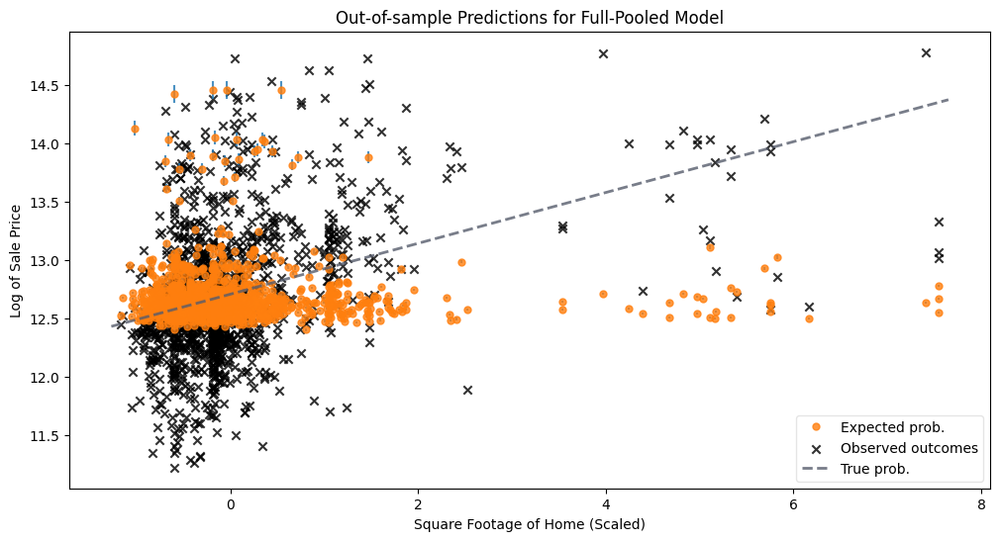

In [169]:
_, ax = plt.subplots(figsize=(12, 6))

preds_out_of_sample = fullpool_posterior_predictions.predictions_constant_data.sortby("sqrfeet_idx")["sqrfeet_idx"]
model_preds = fullpool_posterior_predictions.predictions.sortby('mu_dim_2')

# uncertainty about the estimates:
ax.vlines(
    preds_out_of_sample,
    *az.hdi(model_preds)["mu"].transpose("hdi", ...),
    alpha=0.8,
)
# expected probability of success:
ax.plot(
    preds_out_of_sample,
    model_preds["mu"].mean(("chain", "draw")),
    "o",
    ms=5,
    color="C1",
    alpha=0.8,
    label="Expected prob.",
)

# actual outcomes:
ax.scatter(
    x=xtest_sqfoot,
    y=ytest_saleprice,
    marker="x",
    color="k",
    alpha=0.8,
    label="Observed outcomes",
)
# true probabilities:
x = np.linspace(xtest_sqfoot.min() - 0.1, xtest_sqfoot.max() + 0.1)
ax.plot(
    x,
    (true_intercept + true_slope * x),
    lw=2,
    ls="--",
    color="#565C6C",
    alpha=0.8,
    label="True prob.",
)

ax.set_xlabel("Square Footage of Home (Scaled)")
ax.set_ylabel("Log of Sale Price")
ax.set_title("Out-of-sample Predictions for Full-Pooled Model")
ax.legend(fontsize=10, frameon=True, framealpha=0.5);

Text(0, 0.5, 'Log of Sale Price')

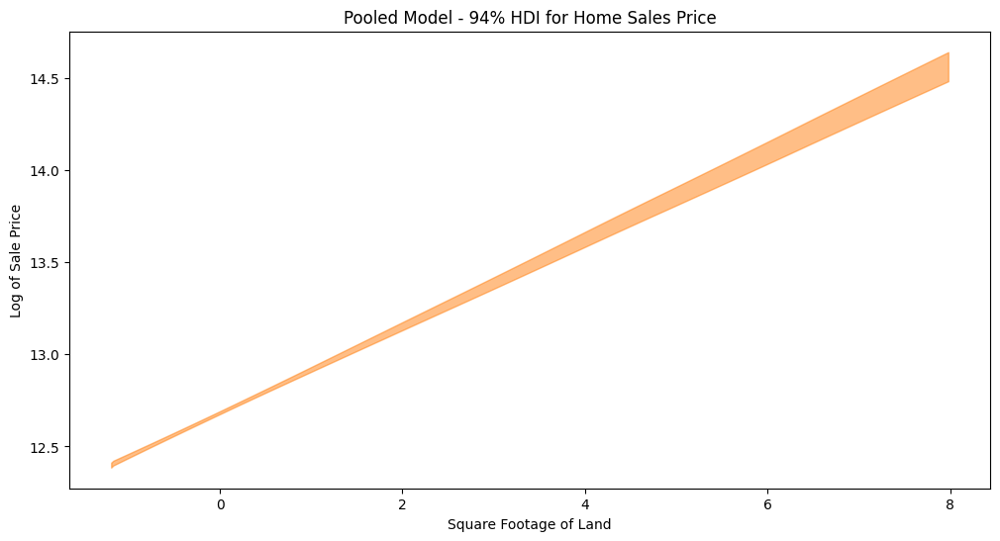

In [182]:
_, ax = plt.subplots(figsize=(12, 6))
rates = fullpool_posterior_predictions.posterior["mu"]
az.plot_hdi(X_train_df['land_sqfoot'], rates, smooth=True, hdi_prob=0.94)
rate_mean = fullpool_posterior_predictions.posterior["mu"].mean(dim=["draw", "chain"])
ax.set_title("Pooled Model - 94% HDI for Home Sales Price")
ax.set_xlabel("Square Footage (Standardized)")
ax.set_ylabel("Log of Sale Price");

#### Unpooled Model

In [170]:
# OOS values
xtest_subcounty = X_test_df['subcounty_coded']
xtest_sqfoot = X_test_df['land_sqfoot']
ytest_saleprice = y_test_df['log_sale_price']
true_slope, true_intercept = np.polyfit(xtest_sqfoot, ytest_saleprice, 1)
# Predictions
with no_pooling:
    # Provide new data
    pm.set_data({"subcounty_idx":xtest_subcounty,
                 "sqrfeet_idx":xtest_sqfoot})

    unpool_posterior_predictions = pm.sample_posterior_predictive(no_pool_idata, var_names=["mu"], return_inferencedata=True,
                                                           predictions=True, extend_inferencedata=True, random_seed=2023)

In [181]:
# Calculate prediction performance metrics
mse = mean_squared_error(ytest_saleprice, unpool_posterior_predictions.predictions.mu_dim_2.values)
print("Unpooled Model - Mean Squared Error:", round(mse,3))
rmse = np.sqrt(mse)
print("Unpooled Model - Root Mean Squared Error:", round(rmse,3))

Pooled Model - Mean Squared Error: 629486.579
Pooled Model - Root Mean Squared Error: 793.402


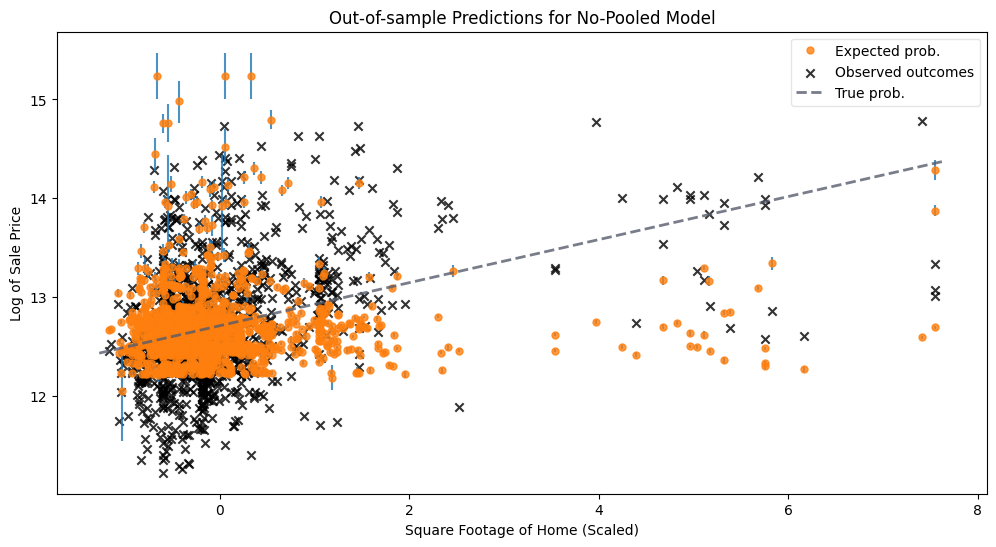

In [172]:
_, ax = plt.subplots(figsize=(12, 6))

preds_out_of_sample = unpool_posterior_predictions.predictions_constant_data.sortby("sqrfeet_idx")["sqrfeet_idx"]
model_preds = unpool_posterior_predictions.predictions.sortby('mu_dim_2')

# uncertainty about the estimates:
ax.vlines(
    preds_out_of_sample,
    *az.hdi(model_preds)["mu"].transpose("hdi", ...),
    alpha=0.8,
)
# expected probability of success:
ax.plot(
    preds_out_of_sample,
    model_preds["mu"].mean(("chain", "draw")),
    "o",
    ms=5,
    color="C1",
    alpha=0.8,
    label="Expected prob.",
)

# actual outcomes:
ax.scatter(
    x=xtest_sqfoot,
    y=ytest_saleprice,
    marker="x",
    color="k",
    alpha=0.8,
    label="Observed outcomes",
)
# true probabilities:
x = np.linspace(xtest_sqfoot.min() - 0.1, xtest_sqfoot.max() + 0.1)
ax.plot(
    x,
    (true_intercept + true_slope * x),
    lw=2,
    ls="--",
    color="#565C6C",
    alpha=0.8,
    label="True prob.",
)

ax.set_xlabel("Square Footage of Home (Scaled)")
ax.set_ylabel("Log of Sale Price")
ax.set_title("Out-of-sample Predictions for No-Pooled Model")
ax.legend(fontsize=10, frameon=True, framealpha=0.5);

Text(0, 0.5, 'Log of Sale Price')

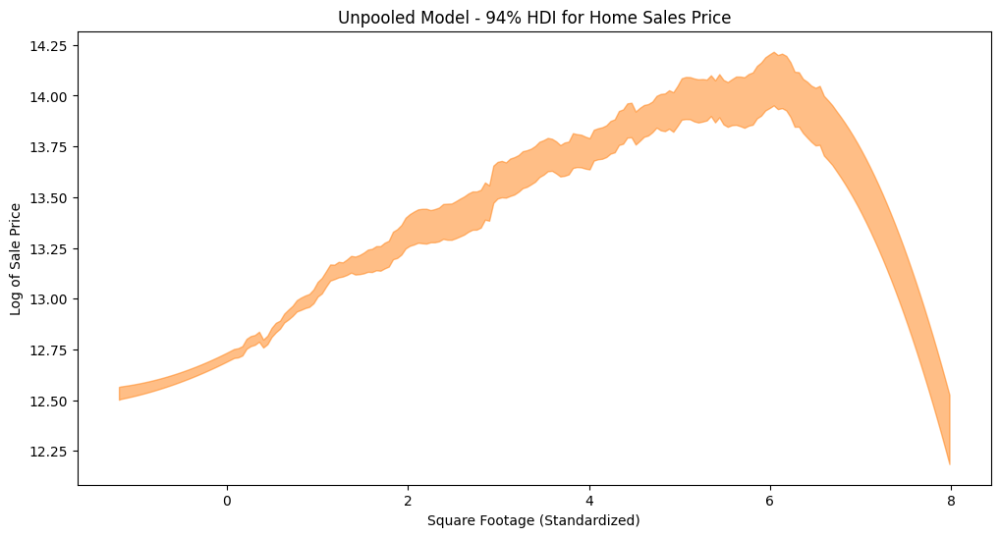

In [183]:
_, ax = plt.subplots(figsize=(12, 6))
rates = unpool_posterior_predictions.posterior["mu"]
az.plot_hdi(X_train_df['land_sqfoot'], rates, smooth=True, hdi_prob=0.94)
rate_mean = unpool_posterior_predictions.posterior["mu"].mean(dim=["draw", "chain"])
ax.set_title("Unpooled Model - 94% HDI for Home Sales Price")
ax.set_xlabel("Square Footage (Standardized)")
ax.set_ylabel("Log of Sale Price")